# Loading libraries

**WARNING** : you need to load an R kernel (and not Python) to run this code.

In [1]:
library(opera)
library(mgcv)
library(caret)
set.seed(1)

Le chargement a nécessité le package : nlme

This is mgcv 1.8-39. For overview type 'help("mgcv-package")'.

Le chargement a nécessité le package : ggplot2

Le chargement a nécessité le package : lattice



# Loading datasets

In [2]:
data_train <- read.csv("data/train.csv")
data_test <- read.csv("data/test1.csv")
all_data <- read.csv('data/interpolated.csv')

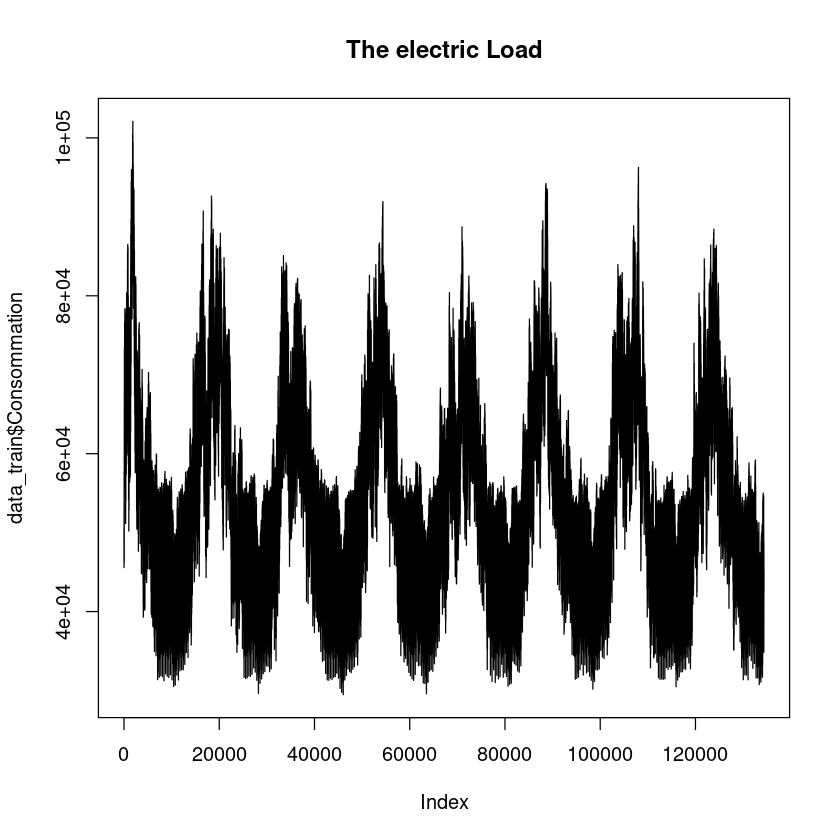

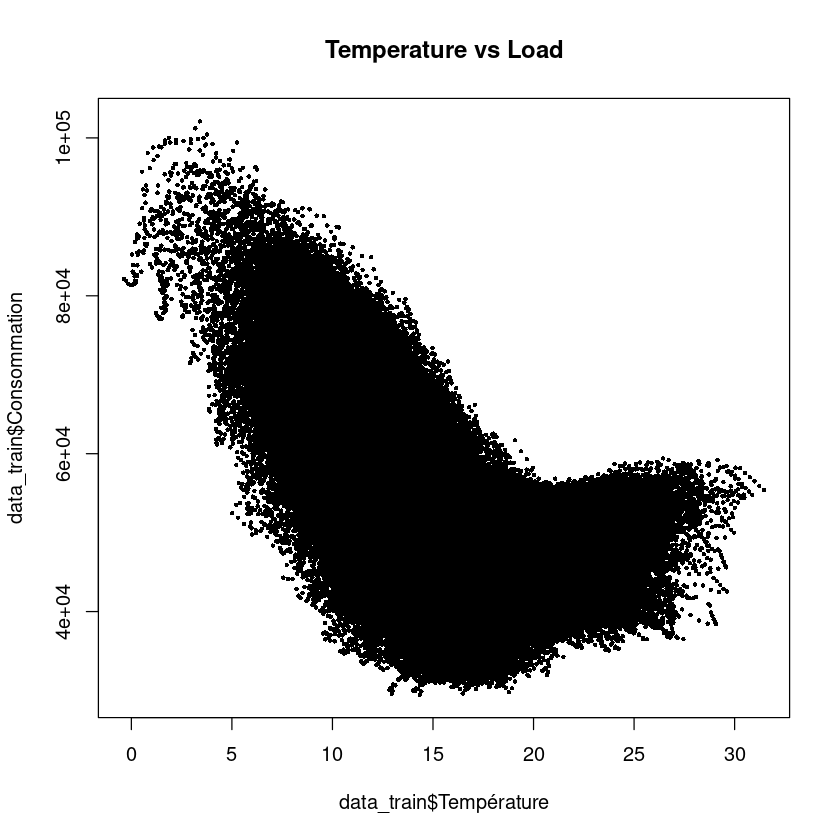

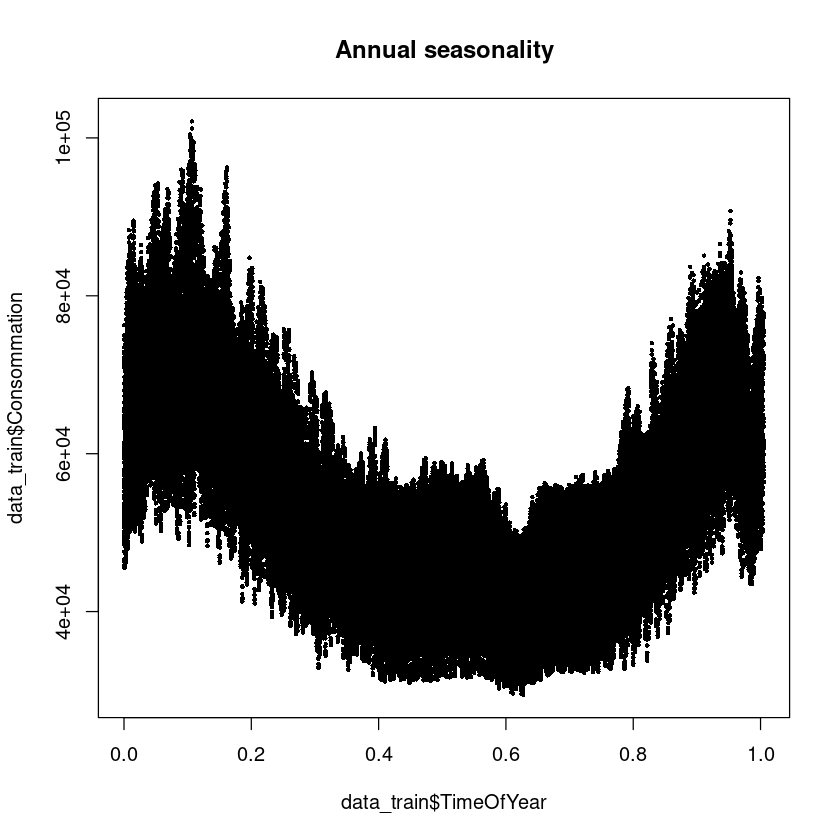

In [3]:
plot(data_train$Consommation, type = "l", main = "The electric Load")
plot(data_train$Température, data_train$Consommation, pch = 16, cex = 0.5, main = "Temperature vs Load")
plot(data_train$TimeOfYear, data_train$Consommation, pch = 16, cex = 0.5, main = "Annual seasonality")


# Build the experts

### GAM

In [4]:
gam.fit <- gam(Consommation ~ s(Température) + s(Temp95) + s(Temp99) +
                s(TempMin99) + s(TempMax99) + s(TimeOfYear, k=3) + 
                as.factor(DayType) + as.factor(DLS) + s(Consommation1) + s(Consommation7),
                data = data_train)

gam.forecast <- predict(gam.fit, newdata = data_test)

### GBM

In [5]:
gbm.fit <- train(Consommation ~  Température + Temp95 + Temp99 + TempMin99 + TempMax99 + TimeOfYear + DayType + DLS + Consommation1 + Consommation7, data = data_train, method = "gbm")
gbm.forecast <- predict(gbm.fit, newdata = data_test)

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1 128791854.7813            -nan     0.1000 19190841.6158
     2 112973897.9922            -nan     0.1000 15740040.7671
     3 99662622.0549            -nan     0.1000 13312127.4222
     4 88283366.3111            -nan     0.1000 11354990.2551
     5 78603767.5392            -nan     0.1000 9662805.8572
     6 70176845.4410            -nan     0.1000 8412125.7845
     7 62944919.4489            -nan     0.1000 7238318.2929
     8 56569873.2529            -nan     0.1000 6389214.1804
     9 51086121.9855            -nan     0.1000 5505004.8696
    10 46155370.2877            -nan     0.1000 4918517.2653
    20 19009918.8086            -nan     0.1000 1593960.2569
    40  5486609.1434            -nan     0.1000 256159.1846
    60  2825121.9758            -nan     0.1000 62625.8107
    80  2126479.0301            -nan     0.1000 15755.1873
   100  1908675.6148            -nan     0.1000 7313.0311
   120  1803688.4488         

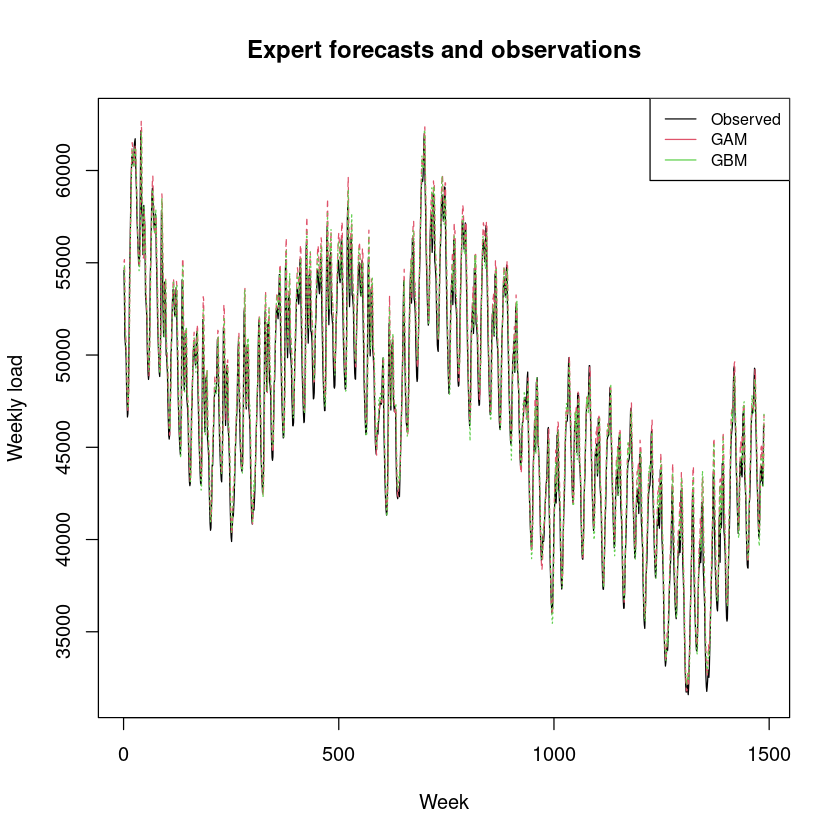

In [17]:
Y <- data_test$Consommation
X <- cbind(gam.forecast, gbm.forecast)
matplot(cbind(Y, X), type = "l", col = 1:6, ylab = "Weekly load", 
        xlab = "Week", main = "Expert forecasts and observations")
legend("topright", legend = c("Observed", "GAM", "GBM"), col = 1:3, lty = 1, cex = 0.8)

In [8]:
oracle.convex <- oracle(Y = Y, experts = X, loss.type = "square", model = "convex")
print(oracle.convex)
plot(oracle.convex)

Call:
oracle.default(Y = Y, experts = X, model = "convex", loss.type = "square")

Coefficients:
 gam.forecast gbm.forecast
        0.229        0.771

                      rmse   mape
Best expert oracle:   1180 0.0196
Uniform combination:  1190 0.0196
Best convex oracle:   1180 0.0195


HTML widgets cannot be represented in plain text (need html)

![image](img/average_loss_experts.png)

# Aggregation of the experts

In [9]:
MLpol0 <- mixture(model = "MLpol", loss.type = "square")
MLpol <- MLpol0
for (i in 1:length(Y)) {
  MLpol <- predict(MLpol, newexperts = X[i, ], newY = Y[i])
}

summary(MLpol)

Aggregation rule: MLpol 
Loss function:  squareloss 
Gradient trick:  TRUE 
Coefficients: 
 gam.forecast gbm.forecast
        0.079        0.921

Number of experts:  2
Number of observations:  1488
Dimension of the data:  1 

        rmse   mape
MLpol   1180 0.0195
Uniform 1190 0.0196

In [10]:
plot(MLpol)

Shiny tags cannot be represented in plain text (need html)

![image](img/weights_experts.png)
![image](img/weights_experts_box.png)
![image](img/dynamic_average_loss.png)
![image](img/cumulative_residuals.png)
![image](img/contribution_experts.png)

In [11]:
predictions <- MLpol$prediction
newexperts <- X[1:3, ] # Experts forecasts to predict 3 new points  
pred <- predict(MLpol, newexperts = newexperts, online = FALSE, type = 'response')

In [12]:
pred = newexperts %*% MLpol$coefficients

In [13]:
YBlock <- seriesToBlock(X = Y, d = 4)
XBlock <- seriesToBlock(X = X, d = 4)

In [14]:
MLpolBlock <- mixture(Y = YBlock, experts = XBlock, model = "MLpol", loss.type = "square")
prediction <- blockToSeries(MLpolBlock$prediction)

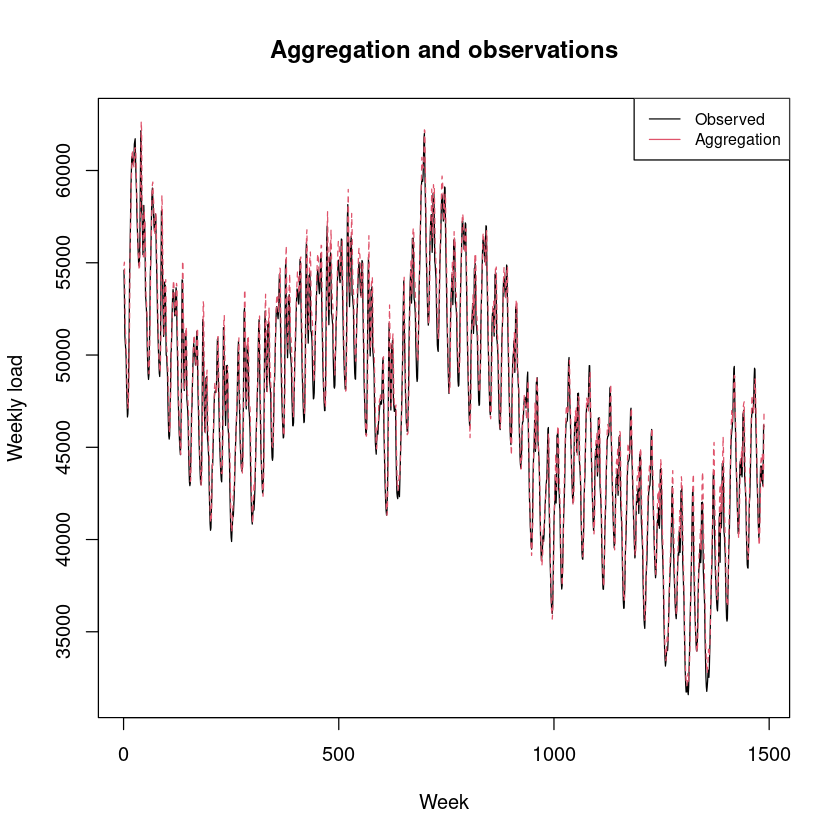

In [18]:
Y <- data_test$Consommation
X <- prediction
matplot(cbind(Y, X), type = "l", col = 1:6, ylab = "Weekly load", 
        xlab = "Week", main = "Aggregation and observations")
legend("topright", legend = c("Observed", "Aggregation"), col = 1:2, lty = 1, cex = 0.8)

In [16]:
# Export the experts in a csv file
write.csv(X, file = "data/experts.csv", row.names = FALSE)